<a href="https://colab.research.google.com/github/VicenteMercado/LabsIA/blob/main/Lab3_Grupo15.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Integrantes:
- Benjamín Díaz
- Benjamín Fernández
- Vicente Mercado
- Thomas Molina

# Objetivos del Laboratorio

Se buscará generar modelos de clasificación que nos permitan clasificar distintas variables a partir de un atributo específico.

Para esto, utilizaremos las dos tablas (Datasets) entregados junto con el problema.

En este caso, el objetivo del modelo de clasificación será clasificar los vinos tintos y los vinos blancos según su calidad, los cuales pueden ser de baja calidad (3 / 4 / 5 puntos), calidad media (6 puntos) o alta calidad (7 / 8 / 9 puntos).

In [ ]:
#@title Importar las librerías necesarias.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.ensemble import RandomForestClassifier
from itertools import combinations

#Análisis Exploratorio de los Datos (EDA):

Esta parte del taller se enfoca en encontrar los atributos que tienen una mayor correlación con un atributo determinado (en este caso, *quality*), en función de establecer variables independientes significativas para los modelos de clasificación.

A continuación, se mostrarán los pasos realizados para el Análisis Exploratorio de Datos:



##Conocer los Datos.

In [ ]:
#@title Leer los CSV.
wineRed = pd.read_csv("winequality-red.csv", sep=";")
wineWhite = pd.read_csv("winequality-white.csv", sep=";")

In [ ]:
#@title Mostrar la cabecera de la tabla de Vinos Tintos
wineRed.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [ ]:
#@title Mostrar la cabecera de la tabla de Vinos Blancos
wineWhite.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [ ]:
#@title Ver el tipo de dato para cada atributo
wineRed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [ ]:
wineWhite.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


Se entiende que no hay datos nulos, y que todos los datos son númericos, por lo que es posible continuar utilizando los datasets originales.

##Asignación de categorías (verbal y númerica)

Para una visualización más comprensible de la distribución de los vinos según su calidad, se creará una nueva columna "verb_quality" que contendrá, en palabras, la categoría correspondiente a un vino dada su puntuación en "quality". 

A su vez, la columna "quality_catnum" contendrá la categoría de cada vino bajo representación numérica, siendo:

1 = lowQuality ; 2 = Average ; 3 = highQuality.

In [ ]:
#Clasificación por categoría verbal.
wineRed["verb_quality"] = pd.cut(x = wineRed["quality"], bins = [2,5,6,np.inf],labels = ["lowQuality", "Average","HighQuality"])
wineWhite["verb_quality"] = pd.cut(x = wineWhite["quality"], bins = [2,5,6,np.inf],labels = ["lowQuality", "Average","HighQuality"])

#Clasificación por categoría numérica.
#1: lowQuality, 2: Average, 3: highQuality 
quality_mapping_numeric = {3: 1, 4: 1, 5: 1, 6: 2, 7: 3, 8: 3, 9: 3}

wineRed['quality_catnum'] = wineRed['quality'].map(quality_mapping_numeric)
wineRed['quality_catnum'] = pd.to_numeric(wineRed['quality_catnum'])

wineWhite['quality_catnum'] = wineWhite['quality'].map(quality_mapping_numeric)
wineWhite['quality_catnum'] = pd.to_numeric(wineWhite['quality_catnum'])

In [ ]:
#@title Categorización de los vinos tintos.
wineRed

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,verb_quality,quality_catnum
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,lowQuality,1
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,lowQuality,1
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,lowQuality,1
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,Average,2
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,lowQuality,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,lowQuality,1
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,Average,2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,Average,2
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,lowQuality,1


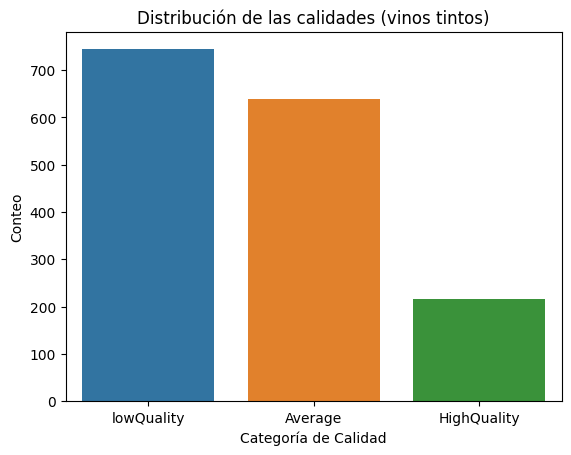

In [ ]:
# Distribución de las calidades de los vinos tintos
sns.countplot(x='verb_quality', data=wineRed)
plt.title('Distribución de las calidades (vinos tintos)')
plt.xlabel('Categoría de Calidad')
plt.ylabel('Conteo')
plt.show()

In [ ]:
#@title Categorización de los vinos blancos.
wineWhite

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,verb_quality,quality_catnum
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,Average,2
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,Average,2
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,Average,2
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,Average,2
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,Average,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,Average,2
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,lowQuality,1
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,Average,2
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,HighQuality,3


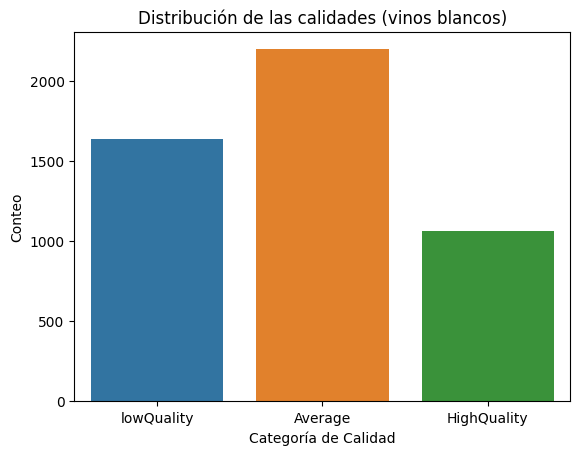

In [ ]:
# Distribución de las calidades de los vinos blancos
sns.countplot(x='verb_quality', data=wineWhite)
plt.title('Distribución de las calidades (vinos blancos)')
plt.xlabel('Categoría de Calidad')
plt.ylabel('Conteo')
plt.show()

##Selección de atributos:

A continuación se explorarán los datos disponibles en función de escoger los atributos que separarían de mejor forma los datos según la característica de calidad anteriormente introducida.

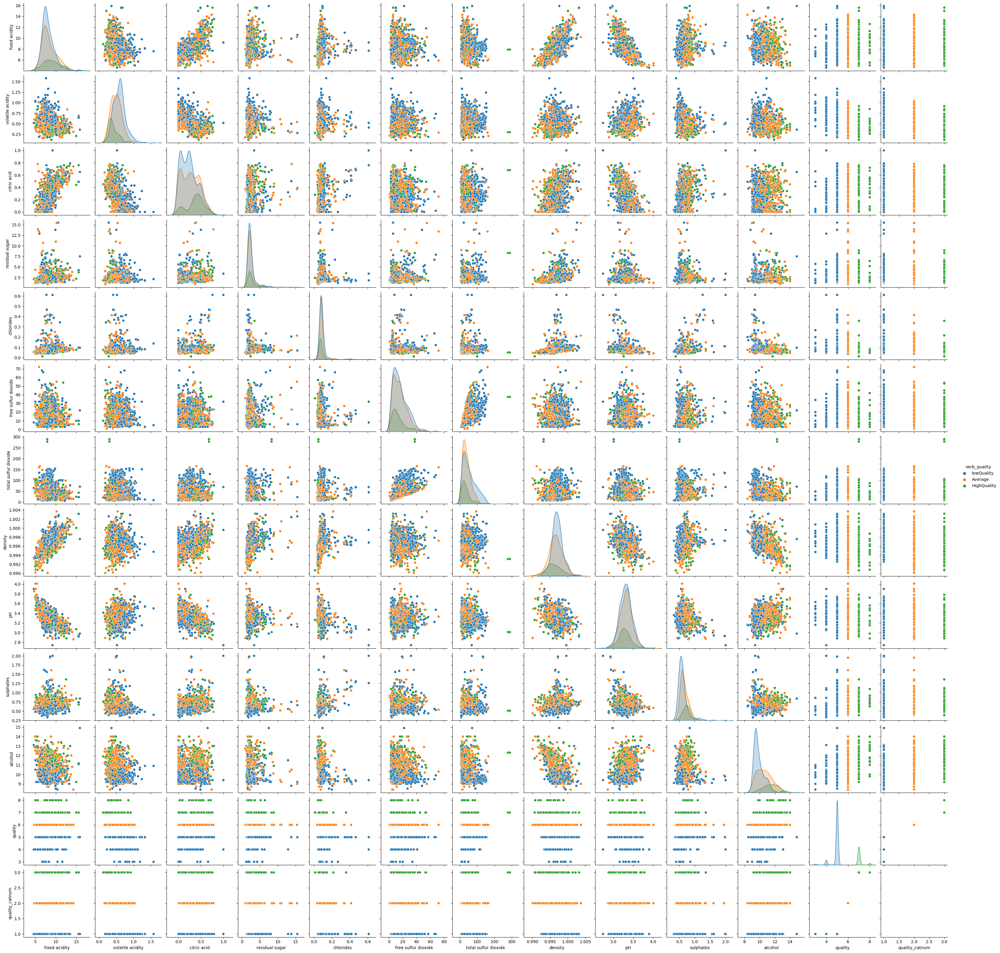

In [ ]:
#@title Gráfica de Vinos Tintos
sns.pairplot(wineRed, hue='verb_quality')

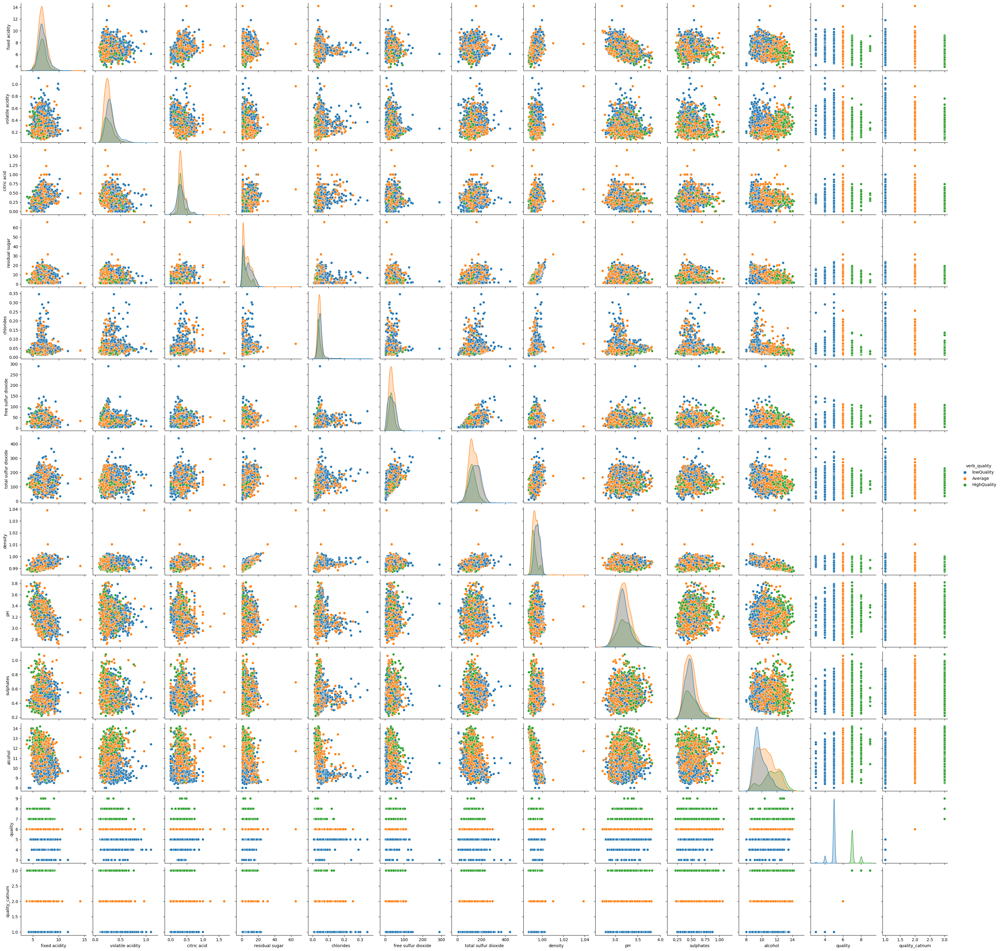

In [ ]:
#@title Gráfica de Vinos Blancos
sns.pairplot(wineWhite, hue='verb_quality')

**Conclusión de los gráficos:**

Dado que las tablas de distribución de los atributos no entregan algún indicio para clasificar, al menos de manera visual, se ocupará la tabla de correlación para escoger las variables a utilizar.

<ipython-input-17-b8fe6b886730>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  mask = np.array(wineRed.corr())
<ipython-input-17-b8fe6b886730>:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data=wineRed.corr(),mask=mask,square=True,annot=True,cbar=True,cmap="YlGnBu")


<Axes: >

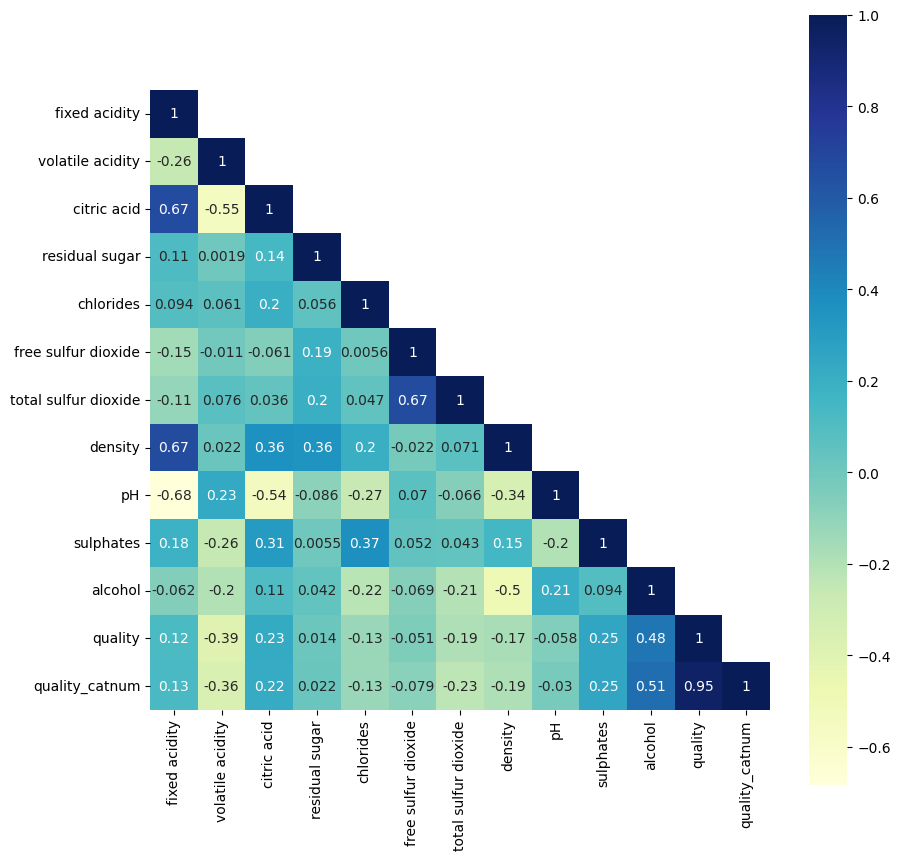

In [ ]:
#@title Tabla de correlación para Vinos Tintos.
mask = np.array(wineRed.corr())
mask[np.tril_indices_from(mask)] = False
fig=plt.gcf()
fig.set_size_inches(10,10)
sns.heatmap(data=wineRed.corr(),mask=mask,square=True,annot=True,cbar=True,cmap="YlGnBu")

Según la tabla de correlación, es posible "fixed acidity", "citric acid", "residual sugar", "sulphates" y "alcohol" puedan ser características que funcionen para un modelo de clasificación, debido a que sus valores en la tabla de correlación son positivos.

Sin embargo, como criterio de selección para los atributos, se observará la distribución de los datos según cada atributo, con el objetivo de determinar si la característica realmente permite diferenciar entre categorías.

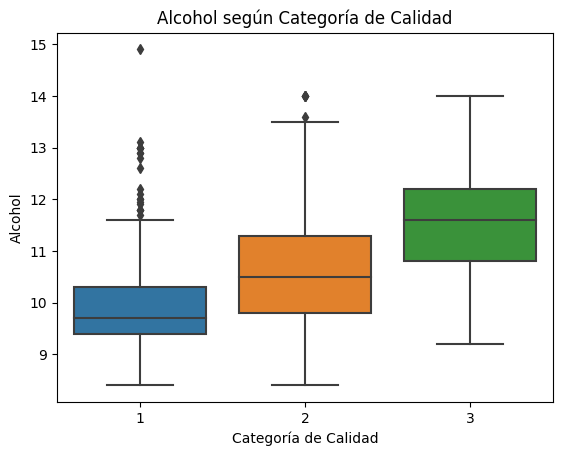

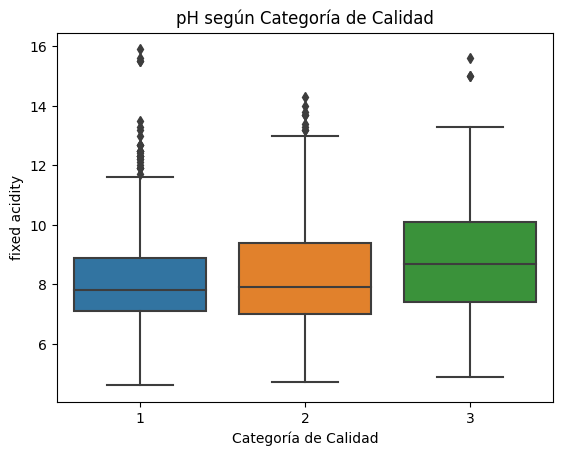

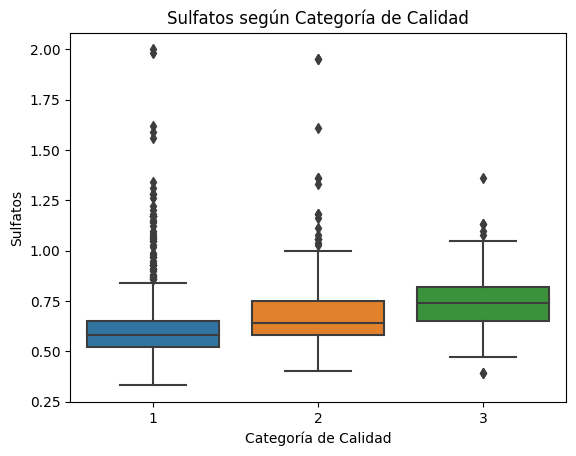

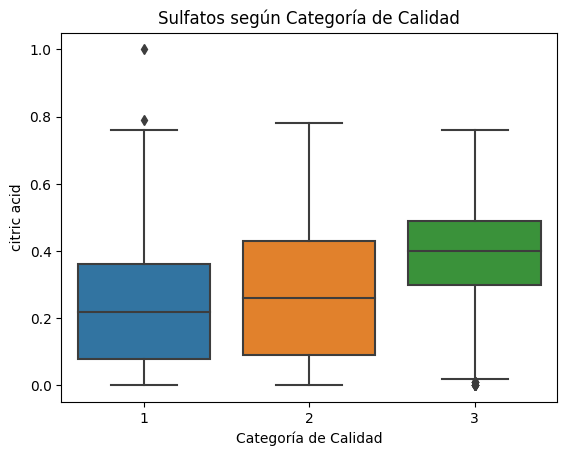

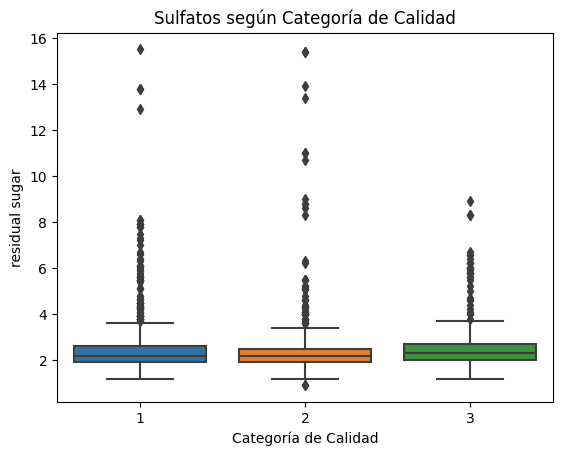

In [ ]:
#@title Observar la distribución.
sns.boxplot(x='quality_catnum', y='alcohol', data=wineRed)
plt.title('Alcohol según Categoría de Calidad')
plt.xlabel('Categoría de Calidad')
plt.ylabel('Alcohol')
plt.show()

sns.boxplot(x='quality_catnum', y='fixed acidity', data=wineRed)
plt.title('pH según Categoría de Calidad')
plt.xlabel('Categoría de Calidad')
plt.ylabel('fixed acidity')
plt.show()

sns.boxplot(x='quality_catnum', y='sulphates', data=wineRed)
plt.title('Sulfatos según Categoría de Calidad')
plt.xlabel('Categoría de Calidad')
plt.ylabel('Sulfatos')
plt.show()

sns.boxplot(x='quality_catnum', y='citric acid', data=wineRed)
plt.title('Sulfatos según Categoría de Calidad')
plt.xlabel('Categoría de Calidad')
plt.ylabel('citric acid')
plt.show()

sns.boxplot(x='quality_catnum', y='residual sugar', data=wineRed)
plt.title('Sulfatos según Categoría de Calidad')
plt.xlabel('Categoría de Calidad')
plt.ylabel('residual sugar')
plt.show()

Como se puede notar en los gráficos de caja y bigote, hay algunos atributos que presentan la mayor parte de alguna categoría dentro de la distribución de otra. Esto no permitiría generar una clasificación de datos correcta, ya que se trabajaría con una muestra muy mixta, por ende, las características con aquella cualidad ("residual sugar", "citric acid", "fixed acidity") son descartadas.

Los atributos "alcohol" y "sulphates" son los más rescatables para la clasificación de datos, dado que el grueso de la muestra de cada categoría se encuentran un poco más separada

<ipython-input-19-4472d6d3a996>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  mask = np.array(wineWhite.corr())
<ipython-input-19-4472d6d3a996>:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data=wineWhite.corr(),mask=mask,square=True,annot=True,cbar=True,cmap="YlGnBu")


<Axes: >

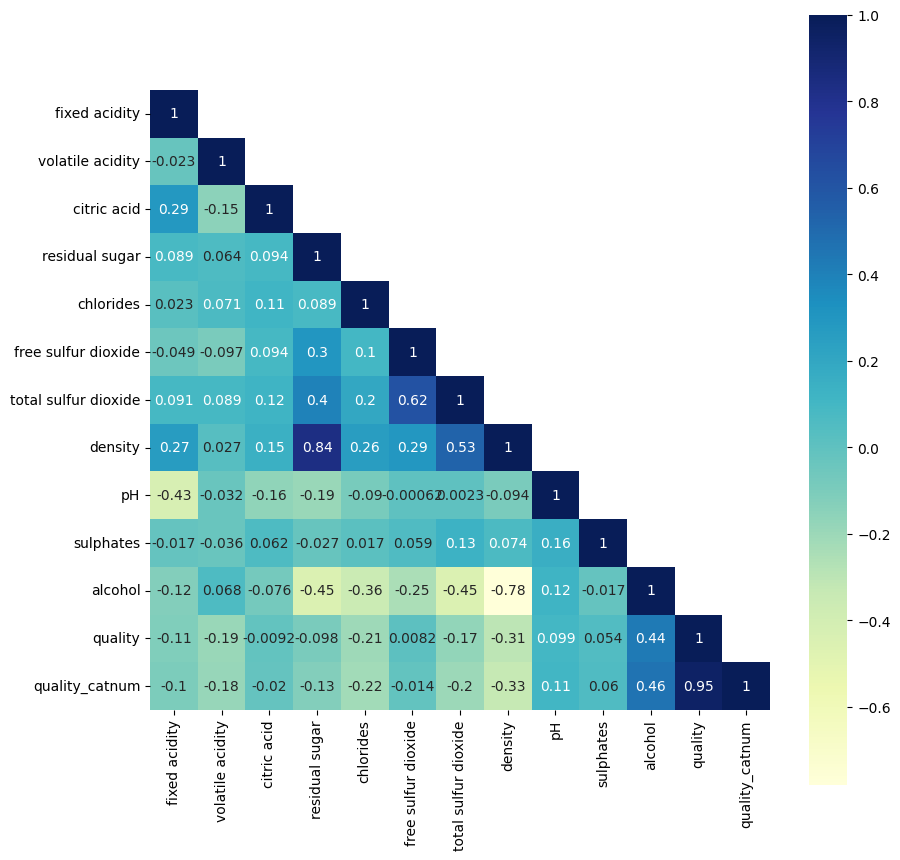

In [ ]:
#@title Tabla de correlación para Vinos Blancos.
mask = np.array(wineWhite.corr())
mask[np.tril_indices_from(mask)] = False
fig=plt.gcf()
fig.set_size_inches(10,10)
sns.heatmap(data=wineWhite.corr(),mask=mask,square=True,annot=True,cbar=True,cmap="YlGnBu")

**Análisis de la tabla:**

En este caso, "pH", "sulphates" y "alcohol" presentan valores positivos en la tabla, por lo que pasan a ser preseleccionados como posibles atributos de clasificación.

A continuación, se mostrará y analizará la distribución de los datos y las categorías con cada una de las características, para realizar la selección final.

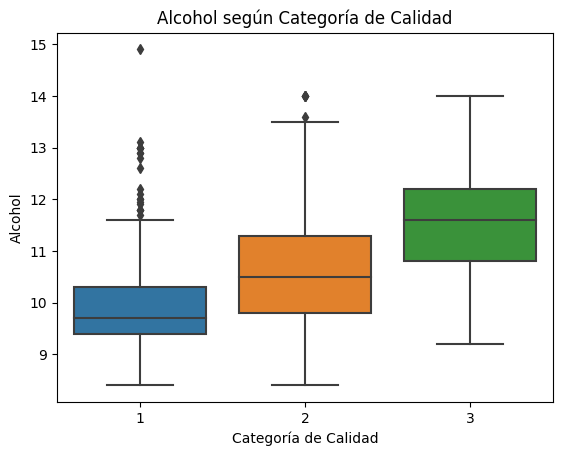

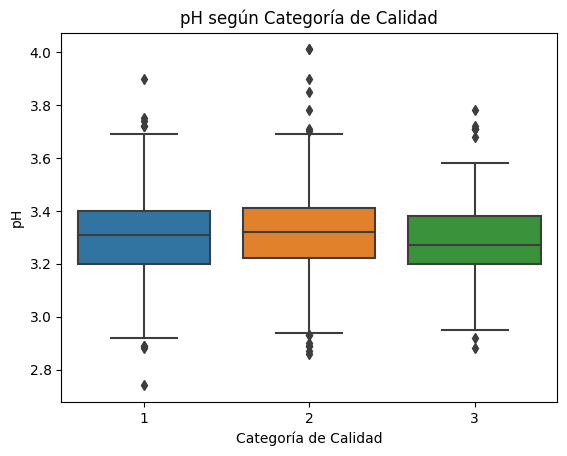

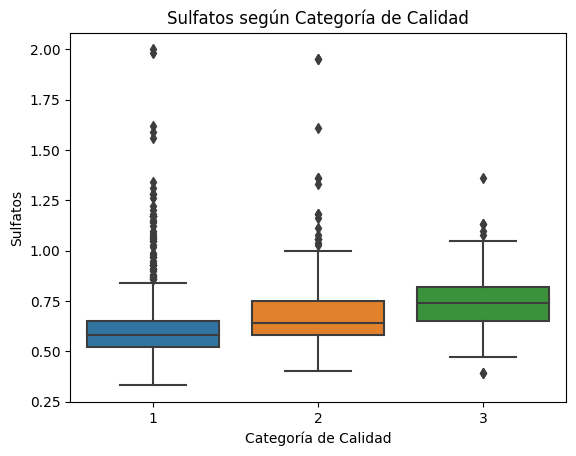

In [ ]:
#@title Observar la distribución.
sns.boxplot(x='quality_catnum', y='alcohol', data=wineRed)
plt.title('Alcohol según Categoría de Calidad')
plt.xlabel('Categoría de Calidad')
plt.ylabel('Alcohol')
plt.show()

sns.boxplot(x='quality_catnum', y='pH', data=wineRed)
plt.title('pH según Categoría de Calidad')
plt.xlabel('Categoría de Calidad')
plt.ylabel('pH')
plt.show()

sns.boxplot(x='quality_catnum', y='sulphates', data=wineRed)
plt.title('Sulfatos según Categoría de Calidad')
plt.xlabel('Categoría de Calidad')
plt.ylabel('Sulfatos')
plt.show()

**Resultados:**

En este caso se aprecia como el atributo "pH" realmente no ayuda a categorizar los datos, pues la distribución es casi la misma en cada categoría. Por lo que es descartada como posible característica.

Los atributos "alcohol" y "sulphates" son nuevamente los elegidos, ya que se logra apreciar cierta separación entre las categorías.

##Mostrar los datos categorizados según los atributos seleccionados.

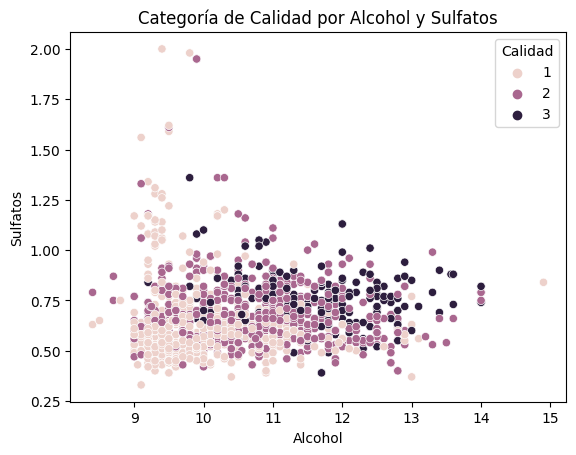

In [ ]:
#@title Datos de Vinos Tintos
sns.scatterplot(x='alcohol', y='sulphates', hue='quality_catnum', data=wineRed)
plt.title('Categoría de Calidad por Alcohol y Sulfatos')
plt.xlabel('Alcohol')
plt.ylabel('Sulfatos')
plt.legend(title='Calidad', loc='best')
plt.show()

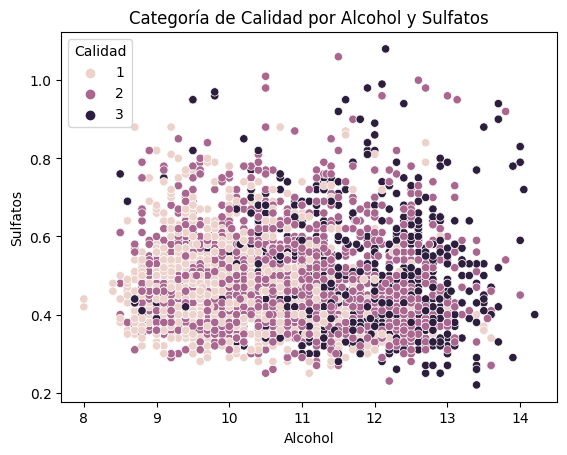

In [ ]:
#@title Datos de Vinos Blancos
sns.scatterplot(x='alcohol', y='sulphates', hue='quality_catnum', data=wineWhite)
plt.title('Categoría de Calidad por Alcohol y Sulfatos')
plt.xlabel('Alcohol')
plt.ylabel('Sulfatos')
plt.legend(title='Calidad', loc='best')
plt.show()

#Clasificación de datos:

En esta sección del lab, se utilizarán distintos métodos de clasificación para conseguir modelos que permitan clasificar los datos entregados de la forma más adecuada posible. Además, para cada método (con y sin K-Fold Cross Validation) se mostrarán las métricas resultantes para cada categoría dentro de la clasificación, donde:

* **Precisión** (Precision): Es la proporción de verdaderos positivos sobre la suma de verdaderos positivos y falsos positivos. Mide la exactitud de las predicciones positivas.

* **Recall** (Recall): También conocido como sensibilidad o tasa de verdaderos positivos, es la proporción de verdaderos positivos sobre la suma de verdaderos positivos y falsos negativos. Mide la capacidad del modelo para encontrar todos los casos positivos.

* **F1-Score** (F1-Score): Es una medida de la precisión y el recall ponderados, donde un F1-Score alto indica un equilibrio entre la precisión y el recall.

* **Soporte** (Support): Es el número de instancias de cada clase en el conjunto de prueba.

* **Accuracy** (Exactitud): Es la proporción de predicciones correctas (verdaderos positivos y verdaderos negativos) sobre el total de predicciones. Mide la precisión global del modelo.

* **Macro Avg**: Calcula el promedio no ponderado de las métricas (precisión, recall, F1-score) para todas las clases. No tiene en cuenta el desequilibrio de clases y trata cada clase por igual.

* **Weighted Avg**: Calcula el promedio ponderado de las métricas (precisión, recall, F1-score) para todas las clases, donde el peso se basa en el soporte de cada clase. Es útil cuando hay desequilibrio en el número de muestras por clase.

##Dividir la muestra en datos de training y testing.

In [ ]:
#@title Vinos Tintos
varXRed = wineRed[['alcohol', 'sulphates']]
varYRed = wineRed['quality_catnum']

trainingRedX, testingRedX, trainingRedY, testingRedY = train_test_split(varXRed, varYRed, test_size=0.15, random_state=42)

In [ ]:
#@title Vinos Blancos
varXWhite = wineWhite[['alcohol', 'sulphates']]
varYWhite = wineWhite['quality_catnum']

trainingWhiteX, testingWhiteX, trainingWhiteY, testingWhiteY = train_test_split(varXWhite, varYWhite, test_size=0.15, random_state=42)

In [ ]:
#@title Funciones para crear la SVM con kfold y sin kfold

##Función con kfold
def clas_SVM_kfold(X_train, Y_train):
  ##Crear la SVM
  svm = SVC(kernel='linear')
  
  ##Realizar k-fold
  kfold = KFold(n_splits=5, shuffle=True, random_state=42)

  ##Realizar crossvalidation
  cross_val_score(svm, X_train, Y_train, cv=kfold)

  # Entrenar el modelo SVM
  svm.fit(X_train, Y_train)

  return svm

##Funcion que entrena el modelo de SVM 80-20
def clas_SVM(X_train, Y_train):
  ##Crear la SVM
  svm = SVC(kernel='linear')

  ##Entrenar el modelo SVM
  svm.fit(X_train, Y_train)
  return svm

##SVM Vinos Tintos:

In [ ]:
#@title Entrenamiento del SVM con KFold Cross Validation y Análisis de la Predicción

#Utilizar los datos de training para realizar un SVM con kfold Cross Validation
svmKFoldRed = clas_SVM_kfold(trainingRedX, trainingRedY)
#Predecir los datos de testing con el SVM conseguido
Y_predRed_KF = svmKFoldRed.predict(testingRedX)
#Obtener un analisis de la clasificación (comparación con los datos reales)
print(classification_report(testingRedY, Y_predRed_KF))

              precision    recall  f1-score   support

           1       0.63      0.81      0.71       108
           2       0.47      0.49      0.48        95
           3       0.00      0.00      0.00        37

    accuracy                           0.56       240
   macro avg       0.37      0.44      0.40       240
weighted avg       0.47      0.56      0.51       240



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
#@title Entrenamiento del SVM sin KFold Cross Validation y Análisis de la Predicción

#Utilizar los datos de training para realizar un SVM sin usar kfold Cross Validation
svmNotKFoldRed = clas_SVM(trainingRedX, trainingRedY)
#Predecir los datos de testing con el SVM conseguido
Y_predRed = svmNotKFoldRed.predict(testingRedX)
#Obtener un analisis de la clasificación (comparación con los datos reales)
print(classification_report(testingRedY, Y_predRed))

              precision    recall  f1-score   support

           1       0.63      0.81      0.71       108
           2       0.47      0.49      0.48        95
           3       0.00      0.00      0.00        37

    accuracy                           0.56       240
   macro avg       0.37      0.44      0.40       240
weighted avg       0.47      0.56      0.51       240



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
<ipython-input-19-3c9e46479378>:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.scatter(X[:, 0], X[:, 1], c=Y, cmap=plt.cm.get_cmap('viridis', 3), edgecolors='k')


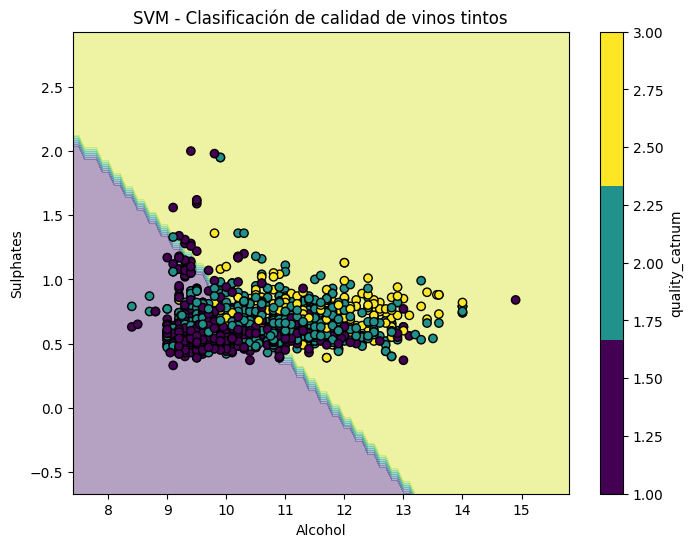

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
<ipython-input-19-3c9e46479378>:33: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.scatter(X[:, 0], X[:, 1], c=Y, cmap=plt.cm.get_cmap('viridis', 3), edgecolors='k')


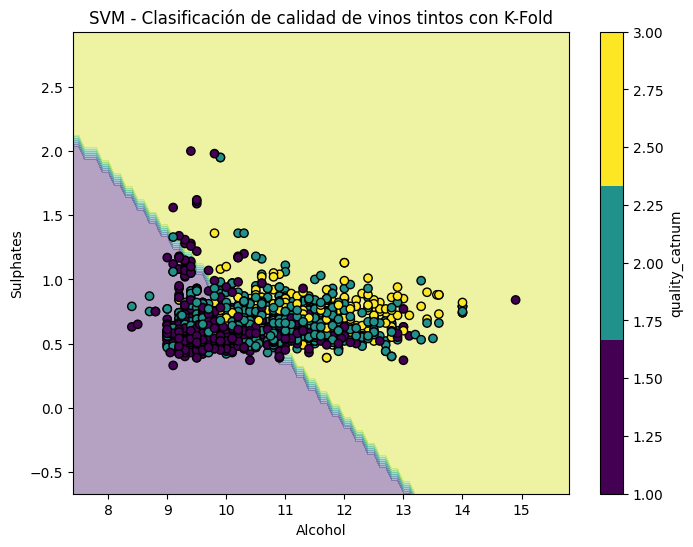

In [ ]:
#@title Gráfica SVM Vino Tinto
X = varXRed.values
Y = varYRed.values

x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1

xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1), np.arange(y_min, y_max, 0.1))
model = svmNotKFoldRed.predict(np.c_[xx.ravel(),yy.ravel()])
model = model.reshape(xx.shape)

plt.figure(figsize=(8, 6))
plt.contourf(xx,yy,model,alpha=0.4)
plt.scatter(X[:, 0], X[:, 1], c=Y, cmap=plt.cm.get_cmap('viridis', 3), edgecolors='k')
plt.colorbar(label='quality_catnum')
plt.xlabel('Alcohol')
plt.ylabel('Sulphates')
plt.title('SVM - Clasificación de calidad de vinos tintos')

plt.show()

#Gráfica SVM con K-Fold Vino Tinto

x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1

xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1), np.arange(y_min, y_max, 0.1))
model = svmKFoldRed.predict(np.c_[xx.ravel(),yy.ravel()])
model = model.reshape(xx.shape)

plt.figure(figsize=(8, 6))
plt.contourf(xx,yy,model,alpha=0.4)
plt.scatter(X[:, 0], X[:, 1], c=Y, cmap=plt.cm.get_cmap('viridis', 3), edgecolors='k')
plt.colorbar(label='quality_catnum')
plt.xlabel('Alcohol')
plt.ylabel('Sulphates')
plt.title('SVM - Clasificación de calidad de vinos tintos con K-Fold')

plt.show()

Anteriormente se observó que para las tablas de clasificación se obtuvieron los mismos valores, ya sea utilizando un método de «Training» estándar y otro bajo implementación de K-Fold cross validation. En ambos gráficos se puede ver que no hay ninguna diferencia en el hiperplano.

3


<ipython-input-20-ae10858cec8e>:37: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.contourf(xx, yy, zz, alpha=0.4, cmap=plt.cm.get_cmap('viridis', 3))
<ipython-input-20-ae10858cec8e>:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=y, cmap=plt.cm.get_cmap('viridis', 3), edgecolors='k')


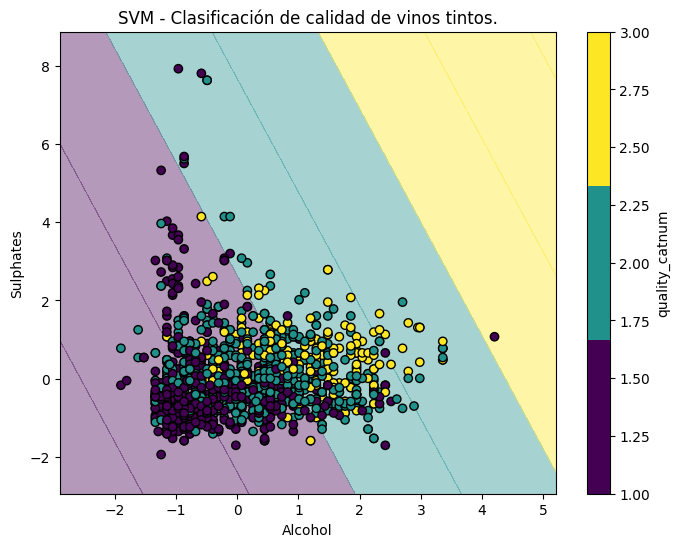

In [ ]:
#@title Gráfica SVM one-vs-all Vino Tinto

X = wineRed[['alcohol', 'sulphates']].values
y = wineRed['quality_catnum'].values

# Escalar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Generar todas las combinaciones posibles de pares de clases
class_combinations = list(combinations(np.unique(y), 2))
print(len(class_combinations))

# Crear un clasificador SVM binario para cada par de clases
svm_classifiers = []
for class_pair in class_combinations:
    class_label_1, class_label_2 = class_pair
    class_indices = np.where((y == class_label_1) | (y == class_label_2))
    X_pair = X_scaled[class_indices]
    y_pair = y[class_indices]
    svm_classifier = SVC(C=1.0, kernel='linear')
    svm_classifier.fit(X_pair, y_pair)
    svm_classifiers.append(svm_classifier)

# Generar puntos para graficar los hiperplanos de separación
x_min, x_max = X_scaled[:, 0].min() - 1, X_scaled[:, 0].max() + 1
y_min, y_max = X_scaled[:, 1].min() - 1, X_scaled[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1), np.arange(y_min, y_max, 0.1))
zz = np.zeros(xx.shape)

# Clasificar cada punto utilizando todos los clasificadores
for svm_classifier in svm_classifiers:
    zz += svm_classifier.decision_function(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)

# Graficar los datos y los hiperplanos de separación
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, zz, alpha=0.4, cmap=plt.cm.get_cmap('viridis', 3))
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=y, cmap=plt.cm.get_cmap('viridis', 3), edgecolors='k')
plt.colorbar(label='quality_catnum')
plt.xlabel('Alcohol')
plt.ylabel('Sulphates')
plt.title('SVM - Clasificación de calidad de vinos tintos.')

plt.show()

Como se puede observar en el gráfico, los datos se encuentran, en su mayoría, bien categorizados. Esto es porque las categorías "low_quality" y "high_quality", utilizando "quality_catnum", no se mezclan de manera significativa.

In [ ]:
#Predecir los datos de testing con el SVM conseguido
Y_predRed = svm_classifier.predict(testingRedX)
#Obtener un analisis de la clasificación (comparación con los datos reales)
print(classification_report(testingRedY, Y_predRed))

              precision    recall  f1-score   support

           1       0.00      0.00      0.00       108
           2       0.40      1.00      0.57        95
           3       0.00      0.00      0.00        37

    accuracy                           0.40       240
   macro avg       0.13      0.33      0.19       240
weighted avg       0.16      0.40      0.22       240



/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SVC was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` pa

##SVM Vinos Blancos:

In [ ]:
#@title Entrenamiento del SVM con KFold Cross Validation y Análisis de la Predicción

#Utilizar los datos de training para realizar un SVM con kfold Cross Validation
svmKFoldWhite = clas_SVM_kfold(trainingWhiteX, trainingWhiteY)
#Predecir los datos de testing con el SVM conseguido
Y_predWhite_KF = svmKFoldWhite.predict(testingWhiteX)
#Obtener un analisis de la clasificación (comparación con los datos reales)
print(classification_report(testingWhiteY, Y_predWhite_KF))

              precision    recall  f1-score   support

           1       0.54      0.62      0.58       248
           2       0.45      0.65      0.53       313
           3       0.00      0.00      0.00       174

    accuracy                           0.48       735
   macro avg       0.33      0.42      0.37       735
weighted avg       0.37      0.48      0.42       735



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
#@title Entrenamiento del SVM sin KFold Cross Validation y Análisis de la Predicción

#Utilizar los datos de training para realizar un SVM sin usar kfold Cross Validation
svmNotKFoldWhite = clas_SVM(trainingWhiteX, trainingWhiteY)
#Predecir los datos de testing con el SVM conseguido
Y_predWhite = svmNotKFoldWhite.predict(testingWhiteX)
#Obtener un analisis de la clasificación (comparación con los datos reales)
print(classification_report(testingWhiteY, Y_predWhite))

              precision    recall  f1-score   support

           1       0.54      0.62      0.58       248
           2       0.45      0.65      0.53       313
           3       0.00      0.00      0.00       174

    accuracy                           0.48       735
   macro avg       0.33      0.42      0.37       735
weighted avg       0.37      0.48      0.42       735



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
<ipython-input-25-ca59f111db97>:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.scatter(X[:, 0], X[:, 1], c=Y, cmap=plt.cm.get_cmap('viridis', 3), edgecolors='k')


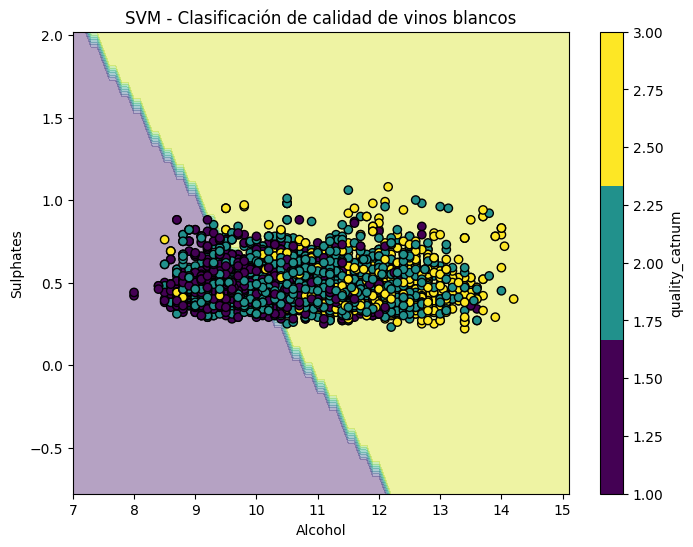

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
<ipython-input-25-ca59f111db97>:33: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.scatter(X[:, 0], X[:, 1], c=Y, cmap=plt.cm.get_cmap('viridis', 3), edgecolors='k')


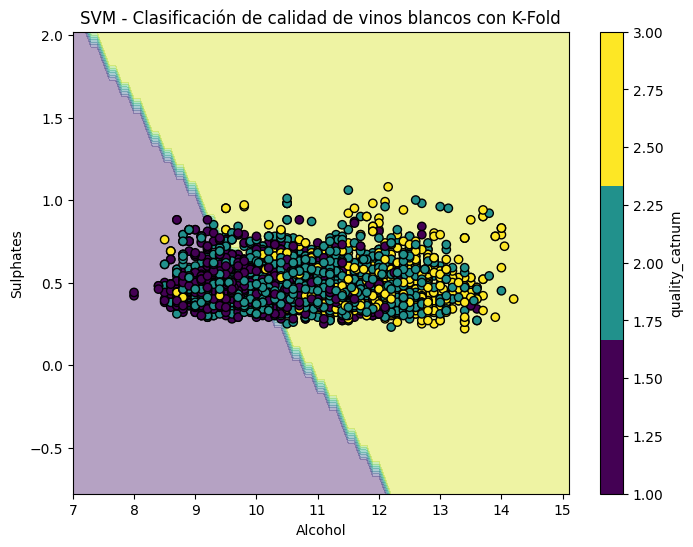

In [ ]:
#@title Gráfica SVM Vino Blanco
X = varXWhite.values
Y = varYWhite.values

x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1

xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1), np.arange(y_min, y_max, 0.1))
model = svmNotKFoldWhite.predict(np.c_[xx.ravel(),yy.ravel()])
model = model.reshape(xx.shape)

plt.figure(figsize=(8, 6))
plt.contourf(xx,yy,model,alpha=0.4)
plt.scatter(X[:, 0], X[:, 1], c=Y, cmap=plt.cm.get_cmap('viridis', 3), edgecolors='k')
plt.colorbar(label='quality_catnum')
plt.xlabel('Alcohol')
plt.ylabel('Sulphates')
plt.title('SVM - Clasificación de calidad de vinos blancos')

plt.show()

#Gráfica SVM con K-Fold Vino Tinto

x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1

xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1), np.arange(y_min, y_max, 0.1))
model = svmKFoldWhite.predict(np.c_[xx.ravel(),yy.ravel()])
model = model.reshape(xx.shape)

plt.figure(figsize=(8, 6))
plt.contourf(xx,yy,model,alpha=0.4)
plt.scatter(X[:, 0], X[:, 1], c=Y, cmap=plt.cm.get_cmap('viridis', 3), edgecolors='k')
plt.colorbar(label='quality_catnum')
plt.xlabel('Alcohol')
plt.ylabel('Sulphates')
plt.title('SVM - Clasificación de calidad de vinos blancos con K-Fold')

plt.show()

Anteriormente se observó que para las tablas de clasificación se obtuvieron los mismos valores, ya sea utilizando un método de «Training» estándar y otro bajo implementación de K-Fold cross validation. En ambos gráficos se puede ver que no hay ninguna diferencia en el hiperplano.

3


<ipython-input-26-65fac425346e>:37: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.contourf(xx, yy, zz, alpha=0.4, cmap=plt.cm.get_cmap('viridis', 3))
<ipython-input-26-65fac425346e>:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=y, cmap=plt.cm.get_cmap('viridis', 3), edgecolors='k')


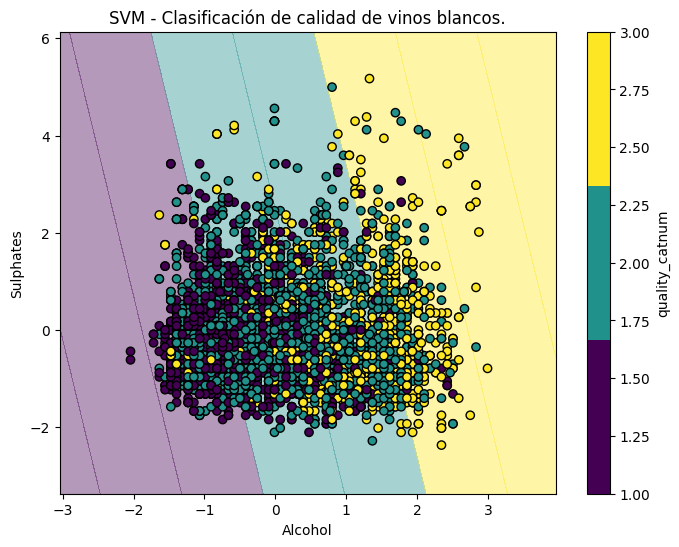

In [ ]:
#@title Gráfica SVM one-vs-all Vino Blanco

X = wineWhite[['alcohol', 'sulphates']].values
y = wineWhite['quality_catnum'].values

# Escalar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Generar todas las combinaciones posibles de pares de clases
class_combinations = list(combinations(np.unique(y), 2))
print(len(class_combinations))

# Crear un clasificador SVM binario para cada par de clases
svm_classifiers = []
for class_pair in class_combinations:
    class_label_1, class_label_2 = class_pair
    class_indices = np.where((y == class_label_1) | (y == class_label_2))
    X_pair = X_scaled[class_indices]
    y_pair = y[class_indices]
    svm_classifier = SVC(C=1.0, kernel='linear')
    svm_classifier.fit(X_pair, y_pair)
    svm_classifiers.append(svm_classifier)

# Generar puntos para graficar los hiperplanos de separación
x_min, x_max = X_scaled[:, 0].min() - 1, X_scaled[:, 0].max() + 1
y_min, y_max = X_scaled[:, 1].min() - 1, X_scaled[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1), np.arange(y_min, y_max, 0.1))
zz = np.zeros(xx.shape)

# Clasificar cada punto utilizando todos los clasificadores
for svm_classifier in svm_classifiers:
    zz += svm_classifier.decision_function(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)

# Graficar los datos y los hiperplanos de separación
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, zz, alpha=0.4, cmap=plt.cm.get_cmap('viridis', 3))
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=y, cmap=plt.cm.get_cmap('viridis', 3), edgecolors='k')
plt.colorbar(label='quality_catnum')
plt.xlabel('Alcohol')
plt.ylabel('Sulphates')
plt.title('SVM - Clasificación de calidad de vinos blancos.')

plt.show()

Como se puede observar en el gráfico, los datos se encuentran, en su mayoría, bien categorizados. Esto es porque las categorías "low_quality" y "high_quality", utilizando "quality_catnum", no se mezclan de manera significativa.

##Árboles de decisión:

###Vinos Tintos.

              precision    recall  f1-score   support

           1       0.58      0.73      0.65       108
           2       0.44      0.40      0.42        95
           3       0.59      0.27      0.37        37

    accuracy                           0.53       240
   macro avg       0.54      0.47      0.48       240
weighted avg       0.52      0.53      0.51       240



[Text(0.5, 0.9166666666666666, 'x[0] <= 9.95\ngini = 0.604\nsamples = 1359\nvalue = [636, 543, 180]'),
 Text(0.25, 0.75, 'x[1] <= 0.575\ngini = 0.421\nsamples = 576\nvalue = [409, 157, 10]'),
 Text(0.125, 0.5833333333333334, 'x[0] <= 9.75\ngini = 0.266\nsamples = 255\nvalue = [215, 39, 1]'),
 Text(0.0625, 0.4166666666666667, 'x[0] <= 9.025\ngini = 0.226\nsamples = 209\nvalue = [182, 26, 1]'),
 Text(0.03125, 0.25, 'x[1] <= 0.54\ngini = 0.463\nsamples = 11\nvalue = [7, 4, 0]'),
 Text(0.015625, 0.08333333333333333, 'gini = 0.278\nsamples = 6\nvalue = [5, 1, 0]'),
 Text(0.046875, 0.08333333333333333, 'gini = 0.48\nsamples = 5\nvalue = [2, 3, 0]'),
 Text(0.09375, 0.25, 'x[1] <= 0.515\ngini = 0.206\nsamples = 198\nvalue = [175, 22, 1]'),
 Text(0.078125, 0.08333333333333333, 'gini = 0.115\nsamples = 82\nvalue = [77, 5, 0]'),
 Text(0.109375, 0.08333333333333333, 'gini = 0.265\nsamples = 116\nvalue = [98, 17, 1]'),
 Text(0.1875, 0.4166666666666667, 'x[1] <= 0.535\ngini = 0.405\nsamples = 46\nva

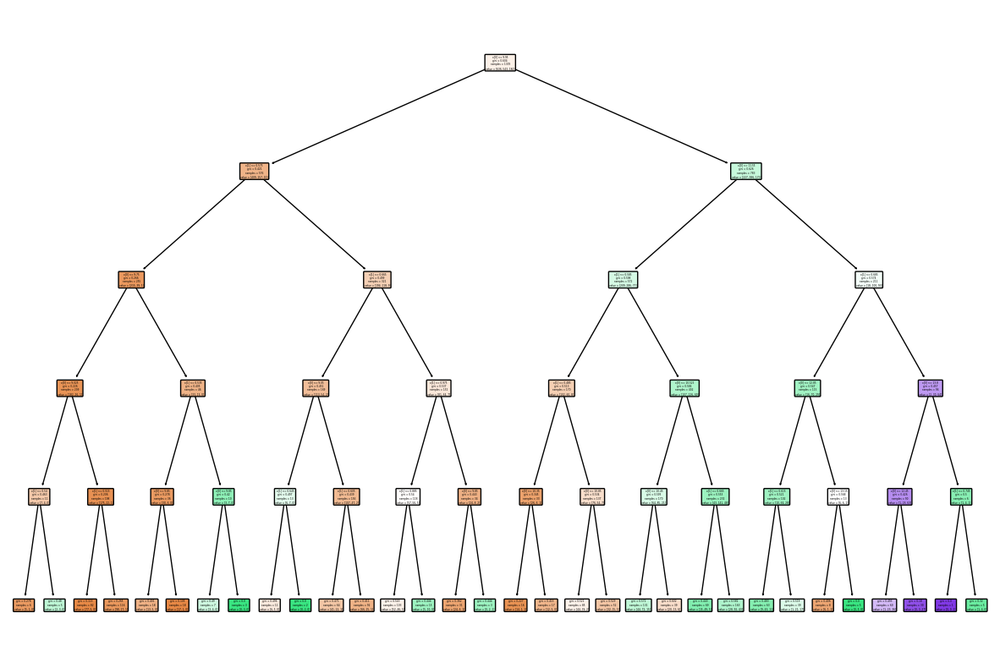

In [ ]:
#@title Entrenamiento de modelo sin K-Fold Cross Validation y visualización de árbol de decisión.
# Creamos el clasificador de árbol de decisión.
treeRed = DecisionTreeClassifier(max_depth = 5)

# Entrenamos el modelo.
treeRed.fit(trainingRedX, trainingRedY)

# Se realizan predicciones acorde al conjunto de testing.
y_predRed = treeRed.predict(testingRedX)

# Evaluamos nuestro modelo.
print(classification_report(testingRedY, y_predRed))

fig=plt.figure(figsize=(15,10))
plot_tree(treeRed,
            filled=True, impurity=True, 
            rounded=True)

              precision    recall  f1-score   support

           1       0.58      0.73      0.65       108
           2       0.44      0.40      0.42        95
           3       0.59      0.27      0.37        37

    accuracy                           0.53       240
   macro avg       0.54      0.47      0.48       240
weighted avg       0.52      0.53      0.51       240



[Text(0.5, 0.9166666666666666, 'x[0] <= 9.95\ngini = 0.604\nsamples = 1359\nvalue = [636, 543, 180]'),
 Text(0.25, 0.75, 'x[1] <= 0.575\ngini = 0.421\nsamples = 576\nvalue = [409, 157, 10]'),
 Text(0.125, 0.5833333333333334, 'x[0] <= 9.75\ngini = 0.266\nsamples = 255\nvalue = [215, 39, 1]'),
 Text(0.0625, 0.4166666666666667, 'x[0] <= 9.025\ngini = 0.226\nsamples = 209\nvalue = [182, 26, 1]'),
 Text(0.03125, 0.25, 'x[1] <= 0.54\ngini = 0.463\nsamples = 11\nvalue = [7, 4, 0]'),
 Text(0.015625, 0.08333333333333333, 'gini = 0.278\nsamples = 6\nvalue = [5, 1, 0]'),
 Text(0.046875, 0.08333333333333333, 'gini = 0.48\nsamples = 5\nvalue = [2, 3, 0]'),
 Text(0.09375, 0.25, 'x[1] <= 0.515\ngini = 0.206\nsamples = 198\nvalue = [175, 22, 1]'),
 Text(0.078125, 0.08333333333333333, 'gini = 0.115\nsamples = 82\nvalue = [77, 5, 0]'),
 Text(0.109375, 0.08333333333333333, 'gini = 0.265\nsamples = 116\nvalue = [98, 17, 1]'),
 Text(0.1875, 0.4166666666666667, 'x[1] <= 0.535\ngini = 0.405\nsamples = 46\nva

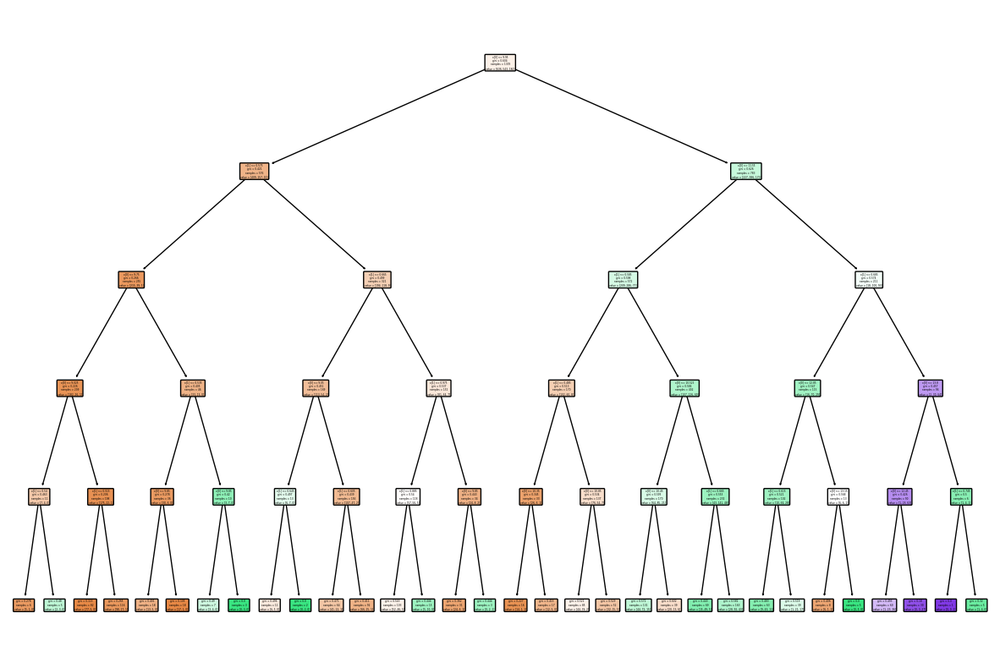

In [ ]:
#@title Entrenamiento de modelo con K-Fold Cross Validation y visualización de árbol de decisión.
# Creamos el clasificador de árbol de decisión.
treeRed = DecisionTreeClassifier(max_depth = 5)

# Se realiza la K-Fold Cross Validation.
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Se obtienen los scores del cross validation.
scores = cross_val_score(treeRed, trainingRedX, trainingRedY, cv=kfold)

# Entrenamos el modelo.
treeRed.fit(trainingRedX, trainingRedY)

# Se realizan predicciones acorde al conjunto de testing.
y_predRed = treeRed.predict(testingRedX)

# Evaluamos nuestro modelo.
print(classification_report(testingRedY, y_predRed))

fig=plt.figure(figsize=(15,10))
plot_tree(treeRed,
            filled=True, impurity=True, 
            rounded=True)

####**Análisis de resultados**.

Al ver los datos obtenidos de ambas versiones de la clasificación de los vinos tintos con árboles de decisión, podemos apreciar que tanto las métricas como las gráficas no sufren cambios notables, independiente de la implementación del K-Fold Cross Validation o su no implementación. Por ende, se concluye que K-Fold no provoca un impacto notable en los árboles de decisión presentes.

###Vinos Blancos.

              precision    recall  f1-score   support

           1       0.55      0.57      0.56       248
           2       0.48      0.61      0.54       313
           3       0.60      0.28      0.38       174

    accuracy                           0.52       735
   macro avg       0.54      0.48      0.49       735
weighted avg       0.53      0.52      0.51       735



[Text(0.5225409836065574, 0.9166666666666666, 'x[0] <= 10.625\ngini = 0.638\nsamples = 4163\nvalue = [1392, 1885, 886]'),
 Text(0.26229508196721313, 0.75, 'x[0] <= 9.767\ngini = 0.576\nsamples = 2431\nvalue = [1149, 1067, 215]'),
 Text(0.13114754098360656, 0.5833333333333334, 'x[0] <= 8.75\ngini = 0.554\nsamples = 1426\nvalue = [779, 536, 111]'),
 Text(0.06557377049180328, 0.4166666666666667, 'x[1] <= 0.665\ngini = 0.499\nsamples = 96\nvalue = [64, 18, 14]'),
 Text(0.03278688524590164, 0.25, 'x[1] <= 0.57\ngini = 0.47\nsamples = 91\nvalue = [63, 18, 10]'),
 Text(0.01639344262295082, 0.08333333333333333, 'gini = 0.444\nsamples = 85\nvalue = [61, 14, 10]'),
 Text(0.04918032786885246, 0.08333333333333333, 'gini = 0.444\nsamples = 6\nvalue = [2, 4, 0]'),
 Text(0.09836065573770492, 0.25, 'x[1] <= 0.82\ngini = 0.32\nsamples = 5\nvalue = [1, 0, 4]'),
 Text(0.08196721311475409, 0.08333333333333333, 'gini = 0.0\nsamples = 4\nvalue = [0, 0, 4]'),
 Text(0.11475409836065574, 0.08333333333333333, '

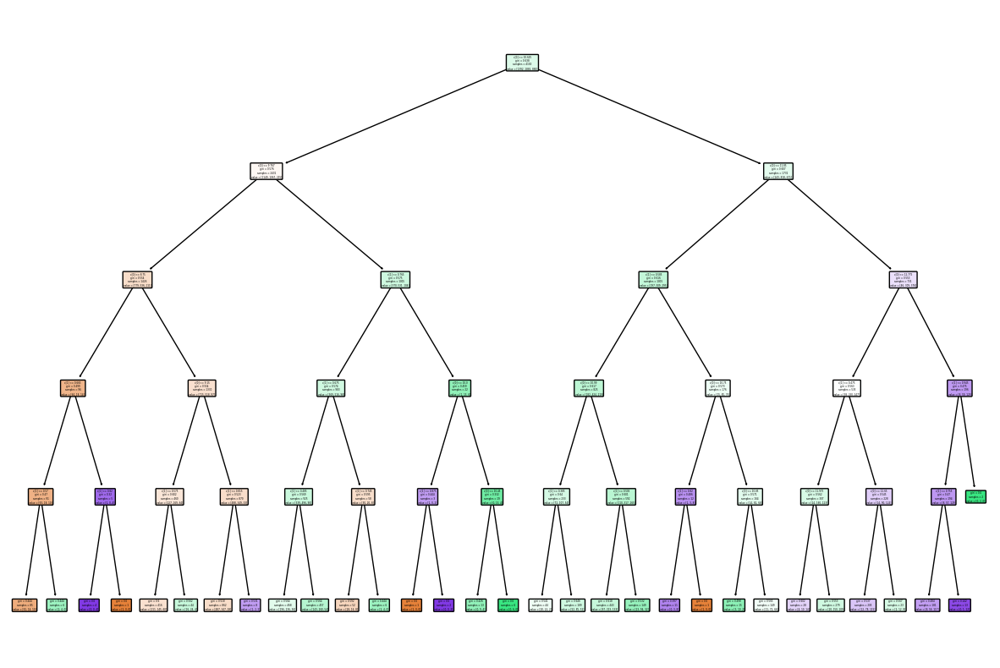

In [ ]:
#@title Entrenamiento de modelo sin K-Fold Cross Validation y visualización de árbol de decisión.
# Creamos el clasificador de árbol de decisión.
treeWhite = DecisionTreeClassifier(max_depth=5)

# Entrenamos el modelo.
treeWhite.fit(trainingWhiteX, trainingWhiteY)

# Se realizan predicciones acorde al conjunto de testing.
y_predWhite = treeWhite.predict(testingWhiteX)

# Evaluamos nuestro modelo.
print(classification_report(testingWhiteY, y_predWhite))

fig=plt.figure(figsize=(15,10))
plot_tree(treeWhite,
            filled=True, impurity=True, 
            rounded=True)

              precision    recall  f1-score   support

           1       0.55      0.57      0.56       248
           2       0.48      0.61      0.54       313
           3       0.60      0.28      0.38       174

    accuracy                           0.52       735
   macro avg       0.54      0.48      0.49       735
weighted avg       0.53      0.52      0.51       735



[Text(0.5225409836065574, 0.9166666666666666, 'x[0] <= 10.625\ngini = 0.638\nsamples = 4163\nvalue = [1392, 1885, 886]'),
 Text(0.26229508196721313, 0.75, 'x[0] <= 9.767\ngini = 0.576\nsamples = 2431\nvalue = [1149, 1067, 215]'),
 Text(0.13114754098360656, 0.5833333333333334, 'x[0] <= 8.75\ngini = 0.554\nsamples = 1426\nvalue = [779, 536, 111]'),
 Text(0.06557377049180328, 0.4166666666666667, 'x[1] <= 0.665\ngini = 0.499\nsamples = 96\nvalue = [64, 18, 14]'),
 Text(0.03278688524590164, 0.25, 'x[1] <= 0.57\ngini = 0.47\nsamples = 91\nvalue = [63, 18, 10]'),
 Text(0.01639344262295082, 0.08333333333333333, 'gini = 0.444\nsamples = 85\nvalue = [61, 14, 10]'),
 Text(0.04918032786885246, 0.08333333333333333, 'gini = 0.444\nsamples = 6\nvalue = [2, 4, 0]'),
 Text(0.09836065573770492, 0.25, 'x[1] <= 0.82\ngini = 0.32\nsamples = 5\nvalue = [1, 0, 4]'),
 Text(0.08196721311475409, 0.08333333333333333, 'gini = 0.0\nsamples = 4\nvalue = [0, 0, 4]'),
 Text(0.11475409836065574, 0.08333333333333333, '

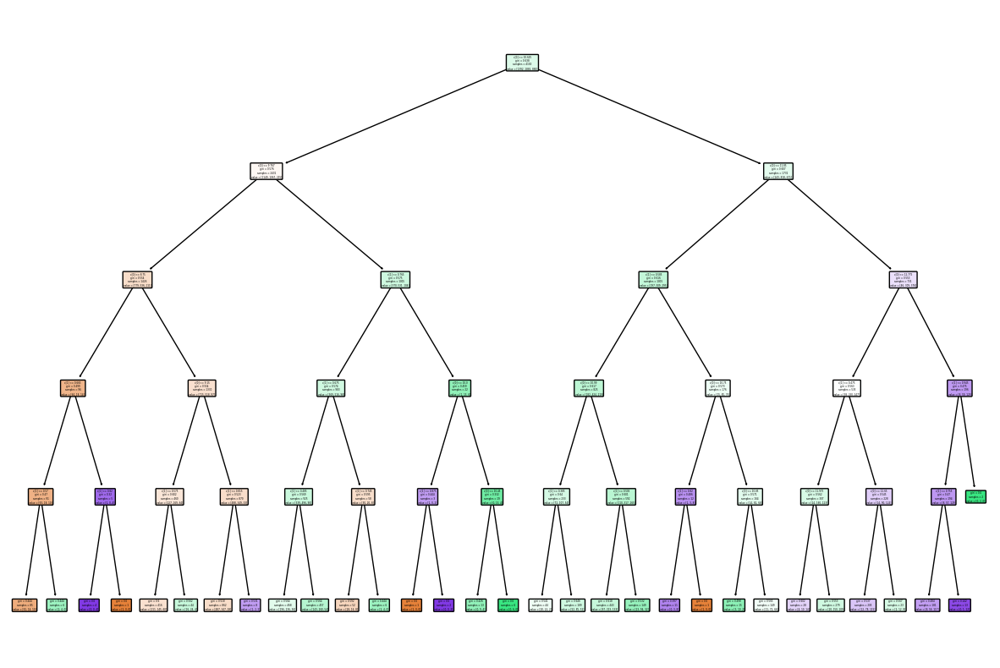

In [ ]:
#@title Entrenamiento de modelo con K-Fold Cross Validation y visualización de árbol de decisión.
# Creamos el clasificador de árbol de decisión.
treeWhite = DecisionTreeClassifier(max_depth=5)

# Se realiza la K-Fold Cross Validation.
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Se obtienen los scores del cross validation.
scores = cross_val_score(treeWhite, trainingWhiteX, trainingWhiteY, cv=kfold)

# Entrenamos el modelo.
treeWhite.fit(trainingWhiteX, trainingWhiteY)

# Se realizan predicciones acorde al conjunto de testing.
y_predWhite = treeWhite.predict(testingWhiteX)

# Evaluamos nuestro modelo.
print(classification_report(testingWhiteY, y_predWhite))

fig=plt.figure(figsize=(15,10))
plot_tree(treeWhite,
            filled=True, impurity=True, 
            rounded=True)

####**Análisis de resultados**.

Al ver los datos obtenidos de ambas versiones de la clasificación de los vinos blancos con árboles de decisión, podemos apreciar que tanto las métricas como las gráficas no sufren cambios notables, independiente de la implementación del K-Fold Cross Validation o su no implementación. Por ende, se concluye que K-Fold no provoca un impacto notable en los árboles de decisión presentes.

##Random Forest

### Vinos Tintos.

In [ ]:
#@title Entrenamiento con K-Fold Cross Validation.

##Crear Random Forest
randForestRed = RandomForestClassifier()

##Realizar kfold
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

##Realizar cross-validation
scores = cross_val_score(randForestRed, trainingRedX, trainingRedY, cv=kfold)

##Entrenar el modelo
randForestRed.fit(trainingRedX, trainingRedY)

##Realizar predicciones
PredictRed = randForestRed.predict(testingRedX)

##Evaluar el modelo obtenido
print(classification_report(testingRedY, PredictRed))

              precision    recall  f1-score   support

           1       0.67      0.72      0.70       108
           2       0.50      0.54      0.52        95
           3       0.38      0.22      0.28        37

    accuracy                           0.57       240
   macro avg       0.52      0.49      0.50       240
weighted avg       0.56      0.57      0.56       240



In [ ]:
#@title Entrenamiento sin K-Fold Cross Validation.

##Crear Random Forest
randForestRed = RandomForestClassifier()

##Entrenar el modelo
randForestRed.fit(trainingRedX, trainingRedY)

##Realizar predicciones
PredictRed = randForestRed.predict(testingRedX)

##Evaluar el modelo obtenido
print(classification_report(testingRedY, PredictRed))

              precision    recall  f1-score   support

           1       0.66      0.75      0.70       108
           2       0.48      0.48      0.48        95
           3       0.38      0.22      0.28        37

    accuracy                           0.56       240
   macro avg       0.51      0.48      0.49       240
weighted avg       0.54      0.56      0.55       240



#### Conclusiones sobre Random-Forest para Vinos Tintos

En el análisis actual, se evalúa en conjunto las métricas para los modelos con K-Fold y sin K-Fold, para determinar si se construyó un buen modelo y saber cuál escoger al momento de clasificar. Primero se verá el conjunto de pruebas, se ve que, con los valores de 108, 95 y 37 muestra un desequilibrio en la muestra, siendo la clase '1' la más poblada. Dicha clase muestra un valor de precisión y recall sobre un 66%, por ende, se puede afirmar que es la clase con mejor exactitud en las clasificaciones, según el modelo entrenado. Las otras dos clases, muestran valores inferiores al 50%, en consecuencia, tendrán poca precisión al momento de clasificar. Apreciando el Accuracy de ambos modelos, se concluye, con un 57% de exactitud los modelos entrenados no son buenos para clasificar.

### Vinos Blancos.

In [ ]:
#@title Entrenamiento con K-Fold Cross Validation.

##Crear Random Forest
randForestWhite = RandomForestClassifier()

##Realizar kfold
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

##Realizar cross-validation
scores = cross_val_score(randForestWhite, trainingWhiteX, trainingWhiteY, cv=kfold)

##Entrenar el modelo
randForestWhite.fit(trainingWhiteX, trainingWhiteY)

##Realizar predicciones
PredictWhite = randForestWhite.predict(testingWhiteX)

##Evaluar el modelo obtenido
print(classification_report(testingWhiteY, PredictWhite))

              precision    recall  f1-score   support

           1       0.54      0.51      0.52       248
           2       0.51      0.57      0.54       313
           3       0.61      0.54      0.57       174

    accuracy                           0.54       735
   macro avg       0.56      0.54      0.55       735
weighted avg       0.55      0.54      0.54       735



In [ ]:
#@title Entrenamiento sin K-Fold Cross Validation.

##Crear Random Forest
randForestWhite = RandomForestClassifier()

##Entrenar el modelo
randForestWhite.fit(trainingWhiteX, trainingWhiteY)

##Realizar predicciones
PredictWhite = randForestWhite.predict(testingWhiteX)

##Evaluar el modelo obtenido
print(classification_report(testingWhiteY, PredictWhite))

              precision    recall  f1-score   support

           1       0.55      0.54      0.55       248
           2       0.53      0.57      0.55       313
           3       0.61      0.53      0.57       174

    accuracy                           0.55       735
   macro avg       0.56      0.55      0.55       735
weighted avg       0.55      0.55      0.55       735



#### Conclusiones sobre Random-Forest para Vinos Blancos

Siguiendo el análisis anterior de ambos modelos a la vez. Las tres clases presentan valores rondando sobre el 50% en sus métricas de precisión y recall, por ello, los valores verdaderos al ser clasificados están balanceados. Considerando las instancias en cada clase, se puede decir que no hay desequilibrio entre ellas, pero al tener bastantes datos se puede entrenar los modelos sin preocuparse que caiga en un sesgo. En resumen, como sus porcentajes están equilibrados, y su Accuracy es de un 55%, los modelos construidos con Random-Forest para los Vinos Tintos no son buenos modelos de clasificación.